In [23]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tarfile
import random
import seaborn as sns
import PIL
from PIL import Image, ImageOps

In [2]:
tar_path = "lab3_data/training_images.tar"
extract_dir = "lab3_data/extracted_images"

os.makedirs(extract_dir, exist_ok=True)

image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif'}

with tarfile.open(tar_path, "r") as tar:
    tar.extractall(path=extract_dir)
    members = tar.getmembers()

print(f"Total files extracted: {len(members)}")

valid_files = []
for member in members:
    file_name = member.name
    if member.isdir():
        continue
    if os.path.basename(file_name).startswith('._'):
        continue
    _, ext = os.path.splitext(file_name)
    if ext.lower() in image_extensions:
        valid_files.append(file_name)

print(f"Number of valid image files: {len(valid_files)}")


/var/folders/yb/gm3s7q8j7rjchq61y16sy76c0000gn/T/ipykernel_34337/4072563893.py:9: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extract_dir)


Total files extracted: 123158
Number of valid image files: 61578


In [4]:
print(f"Total number of images in the training set: {len(valid_files)}")

Total number of images in the training set: 61578


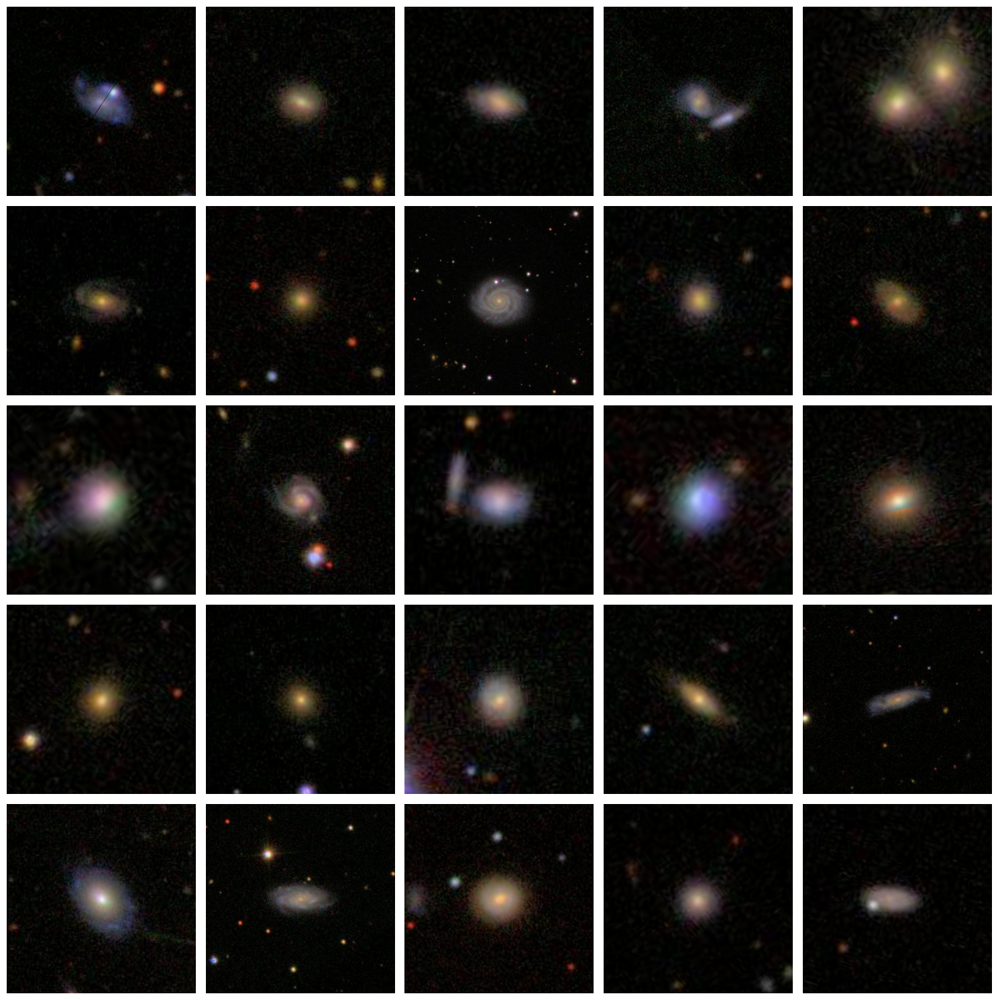

In [5]:
random_files = random.sample(valid_files, 25)
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax in zip(random_files, axes):
    full_path = os.path.join(extract_dir, img_path)
    img = plt.imread(full_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [6]:
train_label_def = pd.read_csv("lab3_data/training_classifications.csv")
orig_cols = train_label_def.columns
cl_names = ["GalaxyID", "Smooth", "Features/Disk", "Star/Artifact", "Edge-On Disk", "Not Edge-On Disk",
            "Bar", "No Bar", "Spiral Arm", "No Spiral Arm", "No Bulge", "Barely Bulge",
            "Obvious Bulge", "Dominant Bulge", "Odd", "Not Odd", "Round", "Between", "Cigar",
            "Ring", "Lens/Arc", "Disturbed", "Irregular", "Other", "Merger", "Dust Lane", 
            "Rounded Bulge", "Boxy Bulge", "Still No Bulge", "Tight Spiral", "Medium Spiral", "Loose Spiral",
            "One Arm", "Two Arm", "Three Arm", "Four Arm", "More Than 4", "Unsure"]
train_labels = train_label_def
cl_label = [i for i in train_labels.columns if f"Galaxy" not in i]
train_labels.columns = cl_names
train_labels

,GalaxyID,Smooth,Features/Disk,Star/Artifact,Edge-On Disk,Not Edge-On Disk,Bar,No Bar,Spiral Arm,No Spiral Arm,...,Still No Bulge,Tight Spiral,Medium Spiral,Loose Spiral,One Arm,Two Arm,Three Arm,Four Arm,More Than 4,Unsure
0,100008,0.383147,0.616853,0.000000,0.000000,0.616853,0.038452,0.578401,0.418398,0.198455,...,0.000000,0.279952,0.138445,0.000000,0.000000,0.092886,0.000000,0.000000,0.0,0.325512
1,100023,0.327001,0.663777,0.009222,0.031178,0.632599,0.467370,0.165229,0.591328,0.041271,...,0.018764,0.000000,0.131378,0.459950,0.000000,0.591328,0.000000,0.000000,0.0,0.000000
2,100053,0.765717,0.177352,0.056931,0.000000,0.177352,0.000000,0.177352,0.000000,0.177352,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
3,100078,0.693377,0.238564,0.068059,0.000000,0.238564,0.109493,0.129071,0.189098,0.049466,...,0.000000,0.094549,0.000000,0.094549,0.189098,0.000000,0.000000,0.000000,0.0,0.000000
4,100090,0.933839,0.000000,0.066161,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61573,999948,0.510379,0.489621,0.000000,0.059207,0.430414,0.000000,0.430414,0.226257,0.204157,...,0.000000,0.226257,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.226257
61574,999950,0.901216,0.098784,0.000000,0.000000,0.098784,0.000000,0.098784,0.000000,0.098784,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
61575,999958,0.202841,0.777376,0.019783,0.116962,0.660414,0.067245,0.593168,0.140022,0.520391,...,0.000000,0.000000,0.090673,0.049349,0.000000,0.067726,0.000000,0.000000,0.0,0.072296
61576,999964,0.091000,0.909000,0.000000,0.045450,0.863550,0.022452,0.841098,0.795330,0.068220,...,0.000000,0.068398,0.318132,0.408799,0.227464,0.408799,0.090668,0.023065,0.0,0.045334


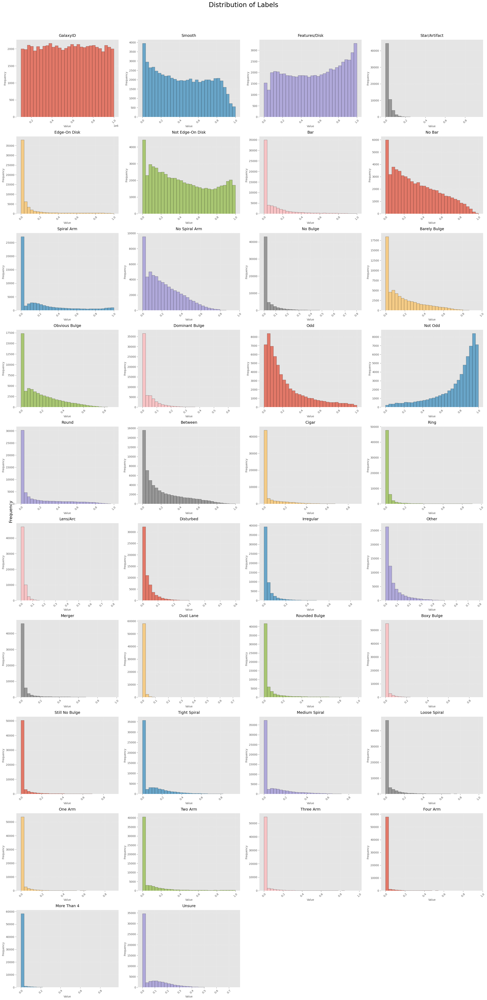

In [7]:
plt.style.use('ggplot') 
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
fig, ax = plt.subplots(10, 4, figsize=(25, 50))
fig.suptitle('Distribution of Labels', fontsize=24, y=1.02)
plt.subplots_adjust(hspace=0.4, wspace=0.3)

for i, label in enumerate(cl_names):
    ax_i = ax[i // 4, i % 4]
    ax_i.hist(train_labels[label], 
              bins=30, 
              color=colors[i % len(colors)],
              edgecolor='black', 
              alpha=0.7)
    
    ax_i.set_title(label, fontsize=14, pad=10)
    ax_i.set_xlabel('Value', fontsize=10)
    ax_i.set_ylabel('Frequency', fontsize=10)
    
    ax_i.grid(True, alpha=0.3, linestyle='--')
    

    ax_i.tick_params(axis='x', rotation=45)
    
    for spine in ax_i.spines.values():
        spine.set_linewidth(0.5)

for i in range(len(cl_names), 40):
    if i < 40:  
        ax[i // 4, i % 4].remove()

fig.text(0.5, 0.02, '', ha='center', fontsize=16)
fig.text(0.02, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=16)

plt.tight_layout()

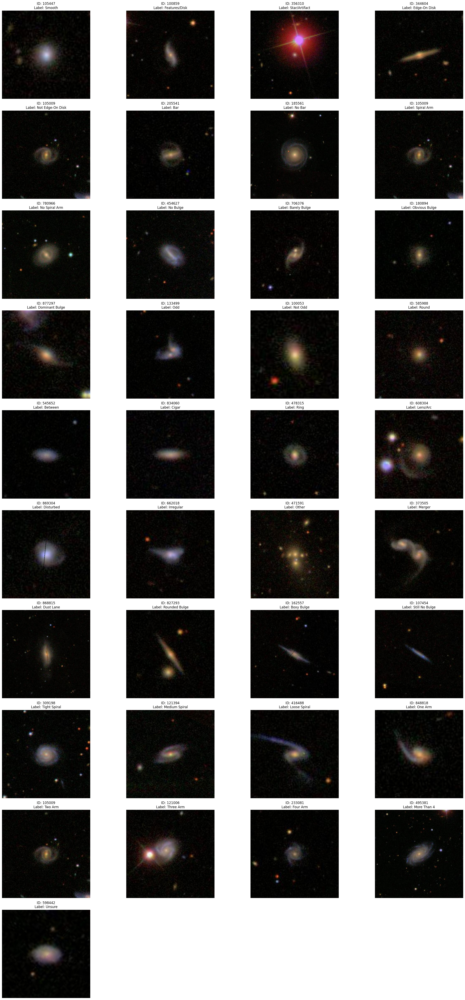

In [10]:
image_dir = os.path.join(extract_dir, 'training_images')

fig, ax = plt.subplots(10, 4, figsize=(25, 50))
for i, label in enumerate(cl_names[1:]):
    ax_i = ax[i // 4, i % 4]
    data = train_labels[["GalaxyID", label]]
    example_data = data[data[label] == data[label].max()].iloc[0]
    galaxy_id = int(example_data["GalaxyID"])
    image_path = os.path.join(image_dir, f"{galaxy_id}.jpg")
    image = np.array(Image.open(image_path))
    ax_i.imshow(image)
    ax_i.set_title(f"ID: {galaxy_id}\nLabel: {label}", fontsize=12)
    ax_i.axis('off')

        
total_plots = len(cl_names[1:])
for j in range(total_plots, 40):
    fig.delaxes(ax.flatten()[j])

plt.tight_layout()
plt.show()

<Axes: >

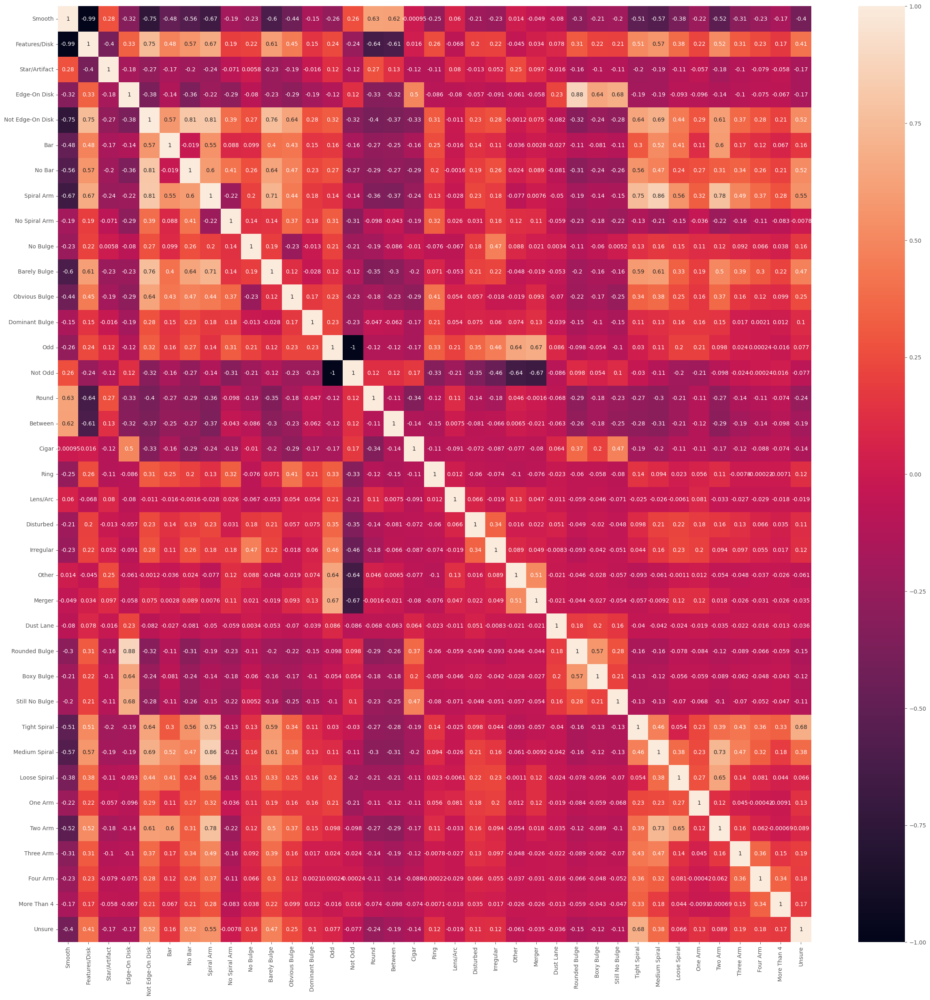

In [12]:
fig = plt.figure(figsize = (30, 30))
sns.heatmap(
        train_labels[cl_names[1:]].corr(),
        annot = True,
    )

In [25]:
output_dir = 'lab3_data/cropped_images'
os.makedirs(output_dir, exist_ok=True)

def downsize_images(input_files, input_dir, output_dir, crop_margin=120, output_size=(70, 70)):
    os.makedirs(output_dir, exist_ok=True)
    for file_name in input_files:
        input_path = os.path.join(input_dir, file_name)
        output_file_name = os.path.basename(file_name) 
        output_path = os.path.join(output_dir, output_file_name)
        try:
            with Image.open(input_path) as image:
                cropped = ImageOps.crop(image, crop_margin)
                resized = cropped.resize(output_size)
                resized.save(output_path)
        except Exception as e:
            print(f"Error processing {input_path}: {e}")

downsize_images(valid_files, extract_dir, output_dir)

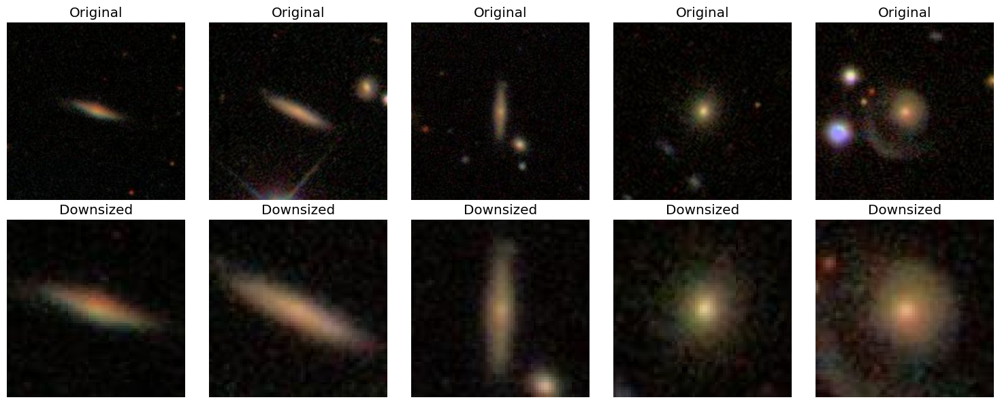

In [27]:
num_images = 5
random_files = random.sample(valid_files, num_images)

fig, axes = plt.subplots(2, num_images, figsize=(15, 6))

for idx, file_name in enumerate(random_files):
    orig_path = os.path.join(extract_dir, file_name)
    downsized_path = os.path.join(output_dir, os.path.basename(file_name))
    
    orig_image = Image.open(orig_path)
    downsized_image = Image.open(downsized_path)
    
    axes[0, idx].imshow(orig_image)
    axes[0, idx].set_title('Original')
    axes[0, idx].axis('off')
    axes[1, idx].imshow(downsized_image)
    axes[1, idx].set_title('Downsized')
    axes[1, idx].axis('off')

plt.tight_layout()
plt.show()